In [111]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

In [112]:
df = pd.read_csv('weather.csv')

In [113]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

In [114]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
count,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000,142193.000000
mean,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235,2.360682
std,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594,8.477969
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,0.000000
25%,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,0.800000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,371.000000


In [115]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


In [116]:
s = (df.dtypes == "object")
object_cols = list(s[s].index)

print("Categorical variables:")
print(object_cols)

Categorical variables:
['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [117]:
# Finding missing values in categorical variables
for i in object_cols:
    print(i, df[i].isnull().sum())

Date 0
Location 0
WindGustDir 9330
WindDir9am 10013
WindDir3pm 3778
RainToday 1406
RainTomorrow 0


In [118]:
# Filling missing values with mode
for i in object_cols:
    df[i] = df[i].fillna(df[i].mode()[0])

In [119]:
# Finding missing values in categorical variables
for i in object_cols:
    print(i, df[i].isnull().sum())

Date 0
Location 0
WindGustDir 0
WindDir9am 0
WindDir3pm 0
RainToday 0
RainTomorrow 0


In [120]:
t = (df.dtypes == "float64")
num_cols = list(t[t].index)

print("Neumeric variables:")
print(num_cols)

Neumeric variables:
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RISK_MM']


In [121]:
# Finding missing values in numeric variables
for i in num_cols:
    print(i, df[i].isnull().sum())

MinTemp 637
MaxTemp 322
Rainfall 1406
Evaporation 60843
Sunshine 67816
WindGustSpeed 9270
WindSpeed9am 1348
WindSpeed3pm 2630
Humidity9am 1774
Humidity3pm 3610
Pressure9am 14014
Pressure3pm 13981
Cloud9am 53657
Cloud3pm 57094
Temp9am 904
Temp3pm 2726
RISK_MM 0


In [122]:
# Filling missing values with median
for i in num_cols:
    df[i] = df[i].fillna(df[i].median())

In [123]:
# Finding missing values in numeric variables
for i in num_cols:
    print(i, df[i].isnull().sum())

MinTemp 0
MaxTemp 0
Rainfall 0
Evaporation 0
Sunshine 0
WindGustSpeed 0
WindSpeed9am 0
WindSpeed3pm 0
Humidity9am 0
Humidity3pm 0
Pressure9am 0
Pressure3pm 0
Cloud9am 0
Cloud3pm 0
Temp9am 0
Temp3pm 0
RISK_MM 0


In [124]:
#Dropping irrelevant columns
columns_to_drop = ['Date', 'RISK_MM', 'Location', 'WindDir9am', 'WindDir3pm', 'WindGustDir']
df = df.drop(columns=columns_to_drop)

# Checking the resulting dataset
print("Remaining Columns:\n", df.columns)

Remaining Columns:
 Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


In [125]:
#Checking for duplicate rows
print(f"Duplicate rows: {df.duplicated().sum()}")

Duplicate rows: 49


In [126]:
#Dropping duplicate rows
df = df.drop_duplicates()

In [127]:
#Checking for duplicate rows
print(f"Duplicate rows: {df.duplicated().sum()}")

Duplicate rows: 0


In [128]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,4.8,8.5,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,7.4,25.1,0.0,4.8,8.5,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No
2,12.9,25.7,0.0,4.8,8.5,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,9.2,28.0,0.0,4.8,8.5,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No
4,17.5,32.3,1.0,4.8,8.5,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [129]:
#Selecting only numeric columns
numeric_cols = df.select_dtypes(include=['number'])

#Defining IQR
Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [130]:
unique_outlier = set()

for col in numeric_cols.columns:
    outliers = df[(df[col] < lower_bound[col]) | (df[col] > upper_bound[col])]
    if not outliers.empty:
        print(f'\nColumn: {col}\n')
        display(outliers)
        unique_outlier.update(outliers.index)
        num_outliers = outliers.shape[0]
        display(f"Number of outliers in {col}: {num_outliers}")

total_unique_outliers = len(unique_outlier)
print(f"\nTotal number of unique outliers: {total_unique_outliers}")



Column: MinTemp



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
45610,-6.9,14.0,0.0,4.0,8.5,30.0,6.0,15.0,84.0,41.0,1030.1,1027.7,0.0,5.0,1.7,13.1,No,No
45611,-6.5,11.1,0.0,2.0,4.1,15.0,0.0,7.0,70.0,66.0,1031.5,1028.1,8.0,0.0,0.8,9.5,No,No
45668,-6.3,12.2,0.2,0.8,8.5,26.0,2.0,7.0,88.0,37.0,1037.2,1033.8,0.0,1.0,1.1,11.8,No,No
45681,-6.3,15.2,0.0,2.0,8.4,35.0,7.0,28.0,96.0,31.0,1030.8,1026.7,1.0,5.0,-1.0,14.5,No,No
45682,-8.0,15.1,0.2,2.6,7.9,39.0,6.0,13.0,96.0,33.0,1029.6,1025.3,1.0,5.0,-1.2,14.5,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103015,31.4,46.2,0.0,22.0,12.6,61.0,30.0,22.0,18.0,7.0,1004.4,1003.0,1.0,1.0,37.9,45.3,No,No
104748,31.4,43.6,0.0,17.2,10.6,70.0,9.0,30.0,27.0,19.0,1008.5,1005.8,5.0,5.0,34.2,41.2,No,No
105423,31.8,44.6,0.0,17.6,9.3,56.0,26.0,19.0,11.0,7.0,1005.6,1001.4,5.0,5.0,36.9,42.3,No,No
113509,31.2,44.3,0.0,4.8,12.2,54.0,31.0,30.0,10.0,22.0,1007.7,1007.8,5.0,5.0,40.2,35.8,No,No


'Number of outliers in MinTemp: 62'


Column: MaxTemp



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
67,22.3,44.8,0.0,4.8,8.5,59.0,9.0,33.0,36.0,11.0,1008.2,1003.8,5.0,5.0,29.6,43.4,No,No
2880,23.0,43.7,0.0,4.8,8.5,44.0,7.0,30.0,67.0,17.0,1009.9,1006.1,5.0,5.0,28.2,42.4,No,No
4384,19.3,45.8,0.0,4.8,8.5,80.0,6.0,20.0,65.0,15.0,1003.0,997.7,5.0,5.0,27.3,43.7,No,No
5775,20.6,45.1,0.0,4.8,8.5,56.0,15.0,13.0,69.0,27.0,1008.3,999.3,5.0,5.0,25.6,41.0,No,No
5780,23.0,44.4,0.0,4.8,8.5,52.0,30.0,30.0,30.0,48.0,1005.6,1005.8,5.0,5.0,37.6,30.9,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141275,26.0,43.8,0.0,4.8,8.5,69.0,19.0,24.0,31.0,14.0,1007.4,1004.1,5.0,5.0,33.1,42.2,No,No
141280,21.4,44.0,0.0,4.8,8.5,41.0,17.0,20.0,13.0,7.0,1007.8,1003.0,1.0,1.0,33.8,42.6,No,No
141317,28.6,43.7,0.0,4.8,8.5,48.0,31.0,26.0,27.0,8.0,1007.2,1005.3,5.0,5.0,36.4,42.2,No,No
141602,26.4,43.7,0.0,4.8,8.5,69.0,30.0,35.0,20.0,7.0,1005.8,1000.3,5.0,5.0,32.7,41.4,No,No


'Number of outliers in MaxTemp: 459'


Column: Rainfall



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
11,15.9,21.7,2.2,4.8,8.5,31.0,15.0,13.0,89.0,91.0,1010.5,1004.2,8.0,8.0,15.9,17.0,Yes,Yes
12,15.9,18.6,15.6,4.8,8.5,61.0,28.0,28.0,76.0,93.0,994.3,993.0,8.0,8.0,17.4,15.8,Yes,Yes
13,12.6,21.0,3.6,4.8,8.5,44.0,24.0,20.0,65.0,43.0,1001.2,1001.8,5.0,7.0,15.8,19.8,Yes,No
16,13.5,22.9,16.8,4.8,8.5,63.0,6.0,20.0,80.0,65.0,1005.8,1002.2,8.0,1.0,18.0,21.5,Yes,Yes
17,11.2,22.5,10.6,4.8,8.5,43.0,24.0,17.0,47.0,32.0,1009.4,1009.7,5.0,2.0,15.5,21.0,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142060,22.2,39.4,6.2,4.8,8.5,30.0,19.0,9.0,56.0,25.0,1008.4,1004.9,5.0,4.0,28.6,38.7,Yes,No
142125,15.2,21.5,6.8,4.8,8.5,30.0,19.0,9.0,65.0,65.0,1016.9,1015.3,3.0,8.0,19.0,21.2,Yes,Yes
142126,17.7,26.9,12.6,4.8,8.5,35.0,15.0,20.0,93.0,59.0,1018.1,1014.7,7.0,8.0,19.0,26.0,Yes,Yes
142127,18.6,28.6,34.6,4.8,8.5,46.0,4.0,9.0,100.0,56.0,1020.0,1015.8,8.0,5.0,19.8,26.9,Yes,Yes


'Number of outliers in Rainfall: 28545'


Column: Evaporation



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
5939,17.9,35.2,0.0,12.0,12.3,48.0,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
5940,18.4,28.9,0.0,14.8,13.0,37.0,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
5941,15.5,34.1,0.0,12.6,13.3,30.0,13.0,7.0,70.0,7.0,1017.6,1011.6,5.0,1.0,16.7,32.7,No,No
5942,19.4,37.6,0.0,10.8,10.6,46.0,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
5943,21.9,38.4,0.0,11.4,12.2,31.0,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140656,10.9,27.8,0.0,8.0,8.5,61.0,13.0,20.0,29.0,52.0,1019.3,1015.1,1.0,5.0,18.5,21.1,No,No
140657,11.6,26.7,0.0,7.8,8.5,41.0,13.0,22.0,32.0,52.0,1020.0,1015.9,6.0,5.0,17.5,21.1,No,No
140662,8.7,29.6,0.0,8.0,8.5,35.0,11.0,17.0,57.0,52.0,1018.5,1014.2,0.0,5.0,17.3,21.1,No,No
140664,10.6,30.8,0.0,8.0,8.5,31.0,9.0,17.0,52.0,52.0,1016.2,1011.9,0.0,5.0,19.3,21.1,No,No


'Number of outliers in Evaporation: 32317'


Column: Sunshine



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
5939,17.9,35.2,0.0,12.0,12.3,48.0,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
5940,18.4,28.9,0.0,14.8,13.0,37.0,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
5941,15.5,34.1,0.0,12.6,13.3,30.0,13.0,7.0,70.0,7.0,1017.6,1011.6,5.0,1.0,16.7,32.7,No,No
5942,19.4,37.6,0.0,10.8,10.6,46.0,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
5943,21.9,38.4,0.0,11.4,12.2,31.0,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139107,21.9,33.0,0.0,5.2,10.9,44.0,15.0,19.0,43.0,28.0,1014.6,1010.6,1.0,1.0,25.1,32.7,No,No
139108,19.3,33.4,0.0,6.0,11.0,35.0,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
139110,20.7,32.8,0.0,5.6,11.0,33.0,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
139111,19.5,31.8,0.0,6.2,10.6,26.0,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


'Number of outliers in Sunshine: 60823'


Column: WindGustSpeed



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8,9.7,31.9,0.0,4.8,8.5,80.0,7.0,28.0,42.0,9.0,1008.9,1003.6,5.0,5.0,18.3,30.2,No,Yes
51,24.4,34.0,0.6,4.8,8.5,98.0,26.0,48.0,60.0,39.0,1005.3,997.8,4.0,1.0,26.1,33.1,No,Yes
61,28.0,43.1,0.0,4.8,8.5,83.0,15.0,9.0,27.0,9.0,1012.5,1008.7,5.0,5.0,32.4,41.9,No,No
83,14.3,34.0,0.0,4.8,8.5,70.0,6.0,22.0,48.0,10.0,1013.0,1009.2,5.0,5.0,20.7,33.4,No,No
102,16.4,27.0,3.0,4.8,8.5,69.0,9.0,22.0,82.0,74.0,1012.7,1008.0,5.0,4.0,19.9,19.7,Yes,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141991,21.9,39.2,0.2,4.8,8.5,69.0,19.0,31.0,47.0,24.0,1009.1,1003.6,1.0,8.0,29.3,37.8,No,Yes
141992,20.4,32.5,16.4,4.8,8.5,69.0,15.0,20.0,87.0,44.0,1010.6,1007.7,8.0,6.0,22.7,32.3,Yes,Yes
142013,22.1,27.4,83.8,4.8,8.5,72.0,31.0,43.0,100.0,100.0,994.6,989.2,8.0,8.0,22.2,24.2,Yes,Yes
142055,25.8,39.2,0.0,4.8,8.5,78.0,20.0,19.0,45.0,30.0,1005.2,1001.7,5.0,5.0,31.0,37.8,No,Yes


'Number of outliers in WindGustSpeed: 5386'


Column: WindSpeed9am



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3277,14.1,18.8,0.0,4.8,8.5,80.0,48.0,37.0,32.0,25.0,1004.9,1004.9,5.0,5.0,16.1,17.1,No,No
3627,9.9,15.4,0.0,4.8,8.5,78.0,39.0,41.0,43.0,40.0,1000.8,1004.4,5.0,5.0,11.0,14.4,No,No
4967,13.7,20.9,0.0,4.8,8.5,61.0,44.0,19.0,26.0,21.0,1017.7,1017.7,5.0,5.0,16.2,20.0,No,No
8973,19.0,23.4,63.6,4.8,0.0,57.0,39.0,33.0,98.0,95.0,1011.3,1011.2,8.0,8.0,20.6,21.0,Yes,Yes
9066,15.4,19.5,42.8,4.0,0.0,76.0,41.0,35.0,80.0,82.0,1015.7,1013.6,8.0,8.0,18.4,18.1,Yes,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137999,24.8,32.6,0.0,8.8,10.8,57.0,39.0,35.0,50.0,36.0,1011.3,1008.3,3.0,1.0,27.3,32.2,No,No
138213,26.1,31.3,9.2,6.2,4.5,59.0,39.0,28.0,84.0,73.0,1005.0,1002.3,8.0,7.0,26.3,30.4,Yes,Yes
138229,25.2,29.3,4.0,8.0,0.0,56.0,39.0,17.0,88.0,90.0,1007.1,1004.0,7.0,8.0,25.2,27.4,Yes,Yes
138565,24.4,28.8,70.8,6.8,0.2,78.0,39.0,43.0,93.0,77.0,1002.3,1001.0,8.0,8.0,25.7,27.6,Yes,Yes


'Number of outliers in WindSpeed9am: 1739'


Column: WindSpeed3pm



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
51,24.4,34.0,0.6,4.8,8.5,98.0,26.0,48.0,60.0,39.0,1005.3,997.8,4.0,1.0,26.1,33.1,No,Yes
354,18.3,28.3,25.8,4.8,8.5,61.0,0.0,46.0,98.0,67.0,1003.7,1003.5,8.0,8.0,19.2,25.6,Yes,No
379,14.5,40.3,0.0,4.8,8.5,107.0,9.0,50.0,40.0,28.0,1008.9,1005.7,5.0,2.0,24.2,31.4,No,Yes
1608,5.8,14.9,17.2,4.8,8.5,69.0,31.0,44.0,94.0,54.0,1004.3,1006.0,8.0,5.0,12.7,13.0,Yes,Yes
1673,11.2,17.7,0.0,4.8,8.5,69.0,26.0,46.0,62.0,43.0,1006.3,1012.0,8.0,1.0,13.9,14.8,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140884,15.0,36.8,0.0,4.8,8.5,70.0,24.0,43.0,25.0,15.0,1010.6,1005.8,5.0,5.0,29.0,35.3,No,No
141843,8.6,27.8,0.0,4.8,8.5,65.0,9.0,41.0,57.0,25.0,1015.4,1010.1,5.0,5.0,16.3,27.6,No,Yes
141924,19.8,30.5,0.0,4.8,8.5,76.0,31.0,48.0,41.0,13.0,1007.7,1005.3,5.0,5.0,24.9,29.8,No,No
141928,18.2,27.3,2.0,4.8,8.5,65.0,31.0,41.0,66.0,11.0,1006.3,1005.6,1.0,5.0,21.4,26.1,Yes,No


'Number of outliers in WindSpeed3pm: 2458'


Column: Humidity9am



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6193,14.5,32.7,0.0,10.8,11.0,46.0,19.0,20.0,17.0,7.0,1018.8,1015.8,0.0,0.0,22.9,32.2,No,No
6195,8.1,24.2,0.0,6.4,10.6,24.0,13.0,9.0,17.0,14.0,1020.9,1016.9,5.0,3.0,17.8,24.1,No,No
6210,7.4,27.6,0.0,5.8,11.9,35.0,17.0,20.0,15.0,6.0,1018.0,1013.1,1.0,0.0,20.6,26.7,No,No
6211,14.7,34.9,0.0,10.0,11.4,43.0,17.0,22.0,9.0,1.0,1013.3,1007.9,0.0,0.0,25.0,33.8,No,No
6230,13.9,32.6,0.0,7.6,12.7,39.0,13.0,13.0,15.0,11.0,1022.6,1018.8,0.0,0.0,23.5,31.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141998,16.3,34.4,0.0,4.8,8.5,48.0,28.0,22.0,16.0,9.0,1015.5,1011.2,5.0,5.0,27.9,33.1,No,No
141999,14.7,37.6,0.0,4.8,8.5,43.0,28.0,9.0,13.0,6.0,1012.1,1007.5,5.0,5.0,29.1,36.3,No,No
142000,16.7,41.7,0.0,4.8,8.5,61.0,26.0,15.0,17.0,7.0,1006.1,1002.6,5.0,5.0,33.2,41.1,No,No
142076,15.9,38.2,0.0,4.8,8.5,37.0,15.0,19.0,15.0,8.0,1012.5,1008.8,5.0,5.0,28.3,37.8,No,No


'Number of outliers in Humidity9am: 1419'


Column: Pressure9am



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
12,15.9,18.6,15.6,4.8,8.5,61.0,28.0,28.0,76.0,93.0,994.3,993.0,8.0,8.0,17.4,15.8,Yes,Yes
294,9.3,16.8,28.8,4.8,8.5,56.0,26.0,30.0,82.0,54.0,997.8,1003.8,5.0,8.0,13.1,15.9,Yes,Yes
315,9.5,15.1,7.0,4.8,8.5,65.0,26.0,30.0,88.0,60.0,1000.5,1002.7,8.0,1.0,10.3,14.1,Yes,Yes
361,12.8,22.3,9.4,4.8,8.5,46.0,6.0,19.0,94.0,54.0,1000.5,1000.9,8.0,4.0,13.5,20.7,Yes,Yes
458,10.6,25.0,0.0,4.8,8.5,20.0,4.0,4.0,72.0,40.0,1036.3,1033.6,5.0,5.0,14.2,24.1,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140503,23.2,31.0,69.0,4.8,8.5,28.0,9.0,9.0,96.0,52.0,1000.2,998.0,8.0,5.0,25.5,21.1,Yes,Yes
141306,22.5,27.1,7.2,4.8,8.5,48.0,19.0,19.0,85.0,97.0,999.2,997.4,7.0,6.0,24.6,22.8,Yes,Yes
142013,22.1,27.4,83.8,4.8,8.5,72.0,31.0,43.0,100.0,100.0,994.6,989.2,8.0,8.0,22.2,24.2,Yes,Yes
142014,22.1,35.8,63.8,4.8,8.5,43.0,17.0,31.0,77.0,41.0,997.8,995.2,4.0,2.0,26.0,33.5,Yes,No


'Number of outliers in Pressure9am: 2708'


Column: Pressure3pm



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
12,15.9,18.6,15.6,4.8,8.5,61.0,28.0,28.0,76.0,93.0,994.3,993.0,8.0,8.0,17.4,15.8,Yes,Yes
51,24.4,34.0,0.6,4.8,8.5,98.0,26.0,48.0,60.0,39.0,1005.3,997.8,4.0,1.0,26.1,33.1,No,Yes
270,7.2,17.9,4.2,4.8,8.5,59.0,20.0,19.0,81.0,80.0,1002.6,996.9,1.0,8.0,13.0,17.5,Yes,Yes
314,6.6,17.7,2.0,4.8,8.5,50.0,17.0,30.0,70.0,71.0,1001.9,997.6,7.0,6.0,10.8,14.8,Yes,Yes
458,10.6,25.0,0.0,4.8,8.5,20.0,4.0,4.0,72.0,40.0,1036.3,1033.6,5.0,5.0,14.2,24.1,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141009,27.5,40.4,0.0,4.8,8.5,46.0,26.0,11.0,32.0,14.0,1002.3,997.9,5.0,5.0,31.0,37.9,No,No
141273,22.0,41.8,5.8,4.8,8.5,61.0,11.0,31.0,56.0,14.0,1002.5,998.3,5.0,1.0,28.1,40.2,Yes,No
141306,22.5,27.1,7.2,4.8,8.5,48.0,19.0,19.0,85.0,97.0,999.2,997.4,7.0,6.0,24.6,22.8,Yes,Yes
142013,22.1,27.4,83.8,4.8,8.5,72.0,31.0,43.0,100.0,100.0,994.6,989.2,8.0,8.0,22.2,24.2,Yes,Yes


'Number of outliers in Pressure3pm: 2305'


Column: Cloud3pm



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
5954,21.6,34.2,0.0,17.4,13.1,44.0,17.0,19.0,19.0,8.0,1014.1,1012.3,0.0,0.0,25.0,32.2,No,No
5976,28.9,41.4,0.0,15.6,12.7,41.0,20.0,19.0,22.0,14.0,1010.4,1008.3,1.0,0.0,32.1,40.0,No,No
5980,14.1,25.9,0.0,11.6,12.3,44.0,22.0,24.0,38.0,19.0,1011.9,1010.1,0.0,0.0,14.8,24.1,No,No
6002,14.1,24.6,0.0,11.0,11.5,46.0,20.0,17.0,50.0,29.0,1016.9,1014.2,1.0,0.0,15.1,22.5,No,No
6003,11.9,26.4,0.0,8.4,12.1,41.0,11.0,9.0,52.0,28.0,1014.8,1012.0,0.0,0.0,16.7,24.9,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139981,9.5,33.0,0.0,5.6,8.5,22.0,7.0,7.0,56.0,24.0,1018.8,1014.5,0.0,0.0,18.1,32.0,No,No
139982,9.6,34.3,0.0,5.6,8.5,26.0,7.0,15.0,45.0,24.0,1018.2,1014.0,0.0,0.0,19.6,33.5,No,No
139987,17.4,30.7,0.0,10.8,8.5,46.0,22.0,19.0,28.0,42.0,1021.2,1016.5,0.0,0.0,21.3,30.0,No,No
139988,16.2,31.6,0.0,9.4,8.5,39.0,26.0,26.0,27.0,26.0,1020.4,1015.9,0.0,0.0,21.5,31.2,No,No


'Number of outliers in Cloud3pm: 4957'


Column: Temp9am



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
5780,23.0,44.4,0.0,4.8,8.5,52.0,30.0,30.0,30.0,48.0,1005.6,1005.8,5.0,5.0,37.6,30.9,No,No
5975,29.1,43.5,0.0,13.0,12.1,28.0,9.0,13.0,25.0,16.0,1007.5,1005.2,1.0,2.0,35.6,41.4,No,No
6261,28.8,45.4,0.0,17.0,8.8,56.0,15.0,15.0,13.0,6.0,1008.2,1004.4,1.0,6.0,37.3,43.3,No,No
6693,25.7,44.3,0.0,12.0,8.5,39.0,17.0,22.0,21.0,14.0,1009.9,1008.9,1.0,5.0,35.7,43.2,No,No
7350,29.4,43.8,0.0,13.6,8.5,52.0,19.0,20.0,22.0,14.0,1004.4,1001.5,3.0,7.0,37.7,42.9,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140977,24.7,44.4,0.0,4.8,8.5,54.0,4.0,24.0,26.0,15.0,1007.5,1003.8,5.0,5.0,36.0,42.0,No,No
141249,23.4,43.0,0.0,4.8,8.5,85.0,19.0,33.0,6.0,9.0,1007.2,1002.4,5.0,1.0,35.6,41.5,No,Yes
141317,28.6,43.7,0.0,4.8,8.5,48.0,31.0,26.0,27.0,8.0,1007.2,1005.3,5.0,5.0,36.4,42.2,No,No
141624,23.1,41.9,0.0,4.8,8.5,69.0,20.0,33.0,7.0,8.0,1006.1,1002.7,1.0,5.0,35.5,40.1,No,No


'Number of outliers in Temp9am: 292'


Column: Temp3pm



,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
43,17.4,43.0,0.0,4.8,8.5,39.0,7.0,17.0,40.0,8.0,1011.6,1006.9,5.0,5.0,25.6,41.5,No,No
59,22.3,42.9,0.0,4.8,8.5,28.0,9.0,11.0,37.0,11.0,1014.6,1010.2,5.0,5.0,29.2,41.2,No,No
60,22.0,42.7,0.0,4.8,8.5,48.0,4.0,4.0,33.0,11.0,1014.2,1010.5,5.0,5.0,29.9,42.0,No,No
61,28.0,43.1,0.0,4.8,8.5,83.0,15.0,9.0,27.0,9.0,1012.5,1008.7,5.0,5.0,32.4,41.9,No,No
66,23.5,42.2,0.0,4.8,8.5,37.0,6.0,15.0,39.0,8.0,1008.0,1005.0,5.0,5.0,28.7,41.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141634,20.0,44.1,0.0,4.8,8.5,57.0,24.0,24.0,9.0,10.0,1010.5,1005.3,5.0,2.0,36.1,41.5,No,No
141698,22.0,42.3,0.0,4.8,8.5,31.0,17.0,19.0,12.0,8.0,1011.1,1007.0,5.0,5.0,31.8,41.0,No,No
141988,20.1,42.2,0.0,4.8,8.5,54.0,9.0,24.0,19.0,8.0,1006.4,1002.1,5.0,3.0,33.2,41.1,No,No
142000,16.7,41.7,0.0,4.8,8.5,61.0,26.0,15.0,17.0,7.0,1006.1,1002.6,5.0,5.0,33.2,41.1,No,No


'Number of outliers in Temp3pm: 840'


Total number of unique outliers: 88941


In [131]:
# Selecting only numeric columns
numeric_cols = df.select_dtypes(include=['number'])

# Defining IQR
Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)
IQR = Q3 - Q1

# Calculating lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Ensuring bounds align correctly for each column
lower_bound = lower_bound.to_dict()
upper_bound = upper_bound.to_dict()

# Capping outliers for each numeric column
for col in numeric_cols.columns:
    df[col] = df[col].clip(lower=lower_bound[col], upper=upper_bound[col])

display(df)


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,4.8,8.5,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,7.4,25.1,0.0,4.8,8.5,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No
2,12.9,25.7,0.0,4.8,8.5,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,9.2,28.0,0.0,4.8,8.5,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No
4,17.5,32.3,1.0,4.8,8.5,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,0.0,4.8,8.5,31.0,15.0,13.0,59.0,27.0,1024.7,1021.2,5.0,5.0,9.4,20.9,No,No
142189,2.8,23.4,0.0,4.8,8.5,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,No,No
142190,3.6,25.3,0.0,4.8,8.5,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,No,No
142191,5.4,26.9,0.0,4.8,8.5,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,No,No


In [133]:
display(df.describe())

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000
mean,12.185814,23.228550,0.385574,4.795262,8.472433,39.602994,13.903689,18.557568,68.910640,51.495568,1017.675615,1015.270017,4.649447,4.737428,16.986747,21.678608
std,6.389089,7.093199,0.610372,1.630136,0.678853,12.203579,8.552910,8.448725,18.782318,20.535763,6.586293,6.555650,2.294743,2.048488,6.465329,6.839528
min,-6.200000,2.450000,0.000000,1.900000,7.450000,8.500000,0.000000,0.000000,18.000000,0.000000,1001.050000,998.400000,0.000000,1.000000,-1.500000,2.300000
25%,7.600000,17.900000,0.000000,4.000000,8.200000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,1011.000000,3.000000,4.000000,12.300000,16.700000
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.200000,0.600000,5.400000,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.400000,6.000000,6.000000,21.500000,26.300000
max,30.600000,43.650000,1.500000,7.500000,9.450000,68.500000,37.000000,40.500000,100.000000,100.000000,1034.250000,1032.000000,9.000000,9.000000,35.300000,40.700000


In [134]:
#Normalizing data
scaler = MinMaxScaler()
numeric_cols = df.select_dtypes(include=['number'])
df[numeric_cols.columns] = scaler.fit_transform(df[numeric_cols.columns])

display(df)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.532609,0.496359,0.400000,0.517857,0.525,0.591667,0.540541,0.592593,0.646341,0.22,0.200301,0.258929,0.888889,0.500,0.500000,0.507812,No,No
1,0.369565,0.549757,0.000000,0.517857,0.525,0.591667,0.108108,0.543210,0.317073,0.25,0.287651,0.279762,0.555556,0.500,0.508152,0.572917,No,No
2,0.519022,0.564320,0.000000,0.517857,0.525,0.625000,0.513514,0.641975,0.243902,0.30,0.197289,0.306548,0.555556,0.125,0.611413,0.544271,No,No
3,0.418478,0.620146,0.000000,0.517857,0.525,0.258333,0.297297,0.222222,0.329268,0.16,0.498494,0.428571,0.555556,0.500,0.532609,0.630208,No,No
4,0.644022,0.724515,0.666667,0.517857,0.525,0.541667,0.189189,0.493827,0.780488,0.33,0.293675,0.226190,0.777778,0.875,0.524457,0.713542,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,0.263587,0.469660,0.000000,0.517857,0.525,0.375000,0.405405,0.320988,0.500000,0.27,0.712349,0.678571,0.555556,0.500,0.296196,0.484375,No,No
142189,0.244565,0.508495,0.000000,0.517857,0.525,0.375000,0.351351,0.271605,0.402439,0.24,0.709337,0.651786,0.555556,0.500,0.315217,0.523438,No,No
142190,0.266304,0.554612,0.000000,0.517857,0.525,0.225000,0.351351,0.222222,0.463415,0.21,0.676205,0.616071,0.555556,0.500,0.336957,0.578125,No,No
142191,0.315217,0.593447,0.000000,0.517857,0.525,0.475000,0.243243,0.222222,0.426829,0.24,0.600904,0.547619,0.555556,0.500,0.380435,0.619792,No,No


In [135]:
display(df.describe())

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000,142144.000000
mean,0.499615,0.504334,0.257049,0.517011,0.511216,0.518383,0.375775,0.458212,0.620861,0.514956,0.500772,0.502084,0.516605,0.467179,0.502357,0.504651
std,0.173617,0.172165,0.406915,0.291096,0.339427,0.203393,0.231160,0.208610,0.229053,0.205358,0.198382,0.195109,0.254971,0.256061,0.175688,0.178113
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.375000,0.375000,0.000000,0.375000,0.375000,0.375000,0.189189,0.320988,0.475610,0.370000,0.375000,0.375000,0.333333,0.375000,0.375000,0.375000
50%,0.494565,0.489078,0.000000,0.517857,0.525000,0.508333,0.351351,0.469136,0.634146,0.520000,0.498494,0.500000,0.555556,0.500000,0.494565,0.489583
75%,0.625000,0.625000,0.400000,0.625000,0.625000,0.625000,0.513514,0.592593,0.792683,0.650000,0.625000,0.625000,0.666667,0.625000,0.625000,0.625000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [136]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.532609,0.496359,0.400000,0.517857,0.525,0.591667,0.540541,0.592593,0.646341,0.22,0.200301,0.258929,0.888889,0.500,0.500000,0.507812,No,No
1,0.369565,0.549757,0.000000,0.517857,0.525,0.591667,0.108108,0.543210,0.317073,0.25,0.287651,0.279762,0.555556,0.500,0.508152,0.572917,No,No
2,0.519022,0.564320,0.000000,0.517857,0.525,0.625000,0.513514,0.641975,0.243902,0.30,0.197289,0.306548,0.555556,0.125,0.611413,0.544271,No,No
3,0.418478,0.620146,0.000000,0.517857,0.525,0.258333,0.297297,0.222222,0.329268,0.16,0.498494,0.428571,0.555556,0.500,0.532609,0.630208,No,No
4,0.644022,0.724515,0.666667,0.517857,0.525,0.541667,0.189189,0.493827,0.780488,0.33,0.293675,0.226190,0.777778,0.875,0.524457,0.713542,No,No


In [137]:
df['RainToday'] = df['RainToday'].map({'Yes': 1, 'No': 0}).astype('Int64')
df['RainTomorrow'] = df['RainTomorrow'].map({'Yes': 1, 'No': 0}).astype('Int64')

In [139]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.532609,0.496359,0.400000,0.517857,0.525,0.591667,0.540541,0.592593,0.646341,0.22,0.200301,0.258929,0.888889,0.500,0.500000,0.507812,0,0
1,0.369565,0.549757,0.000000,0.517857,0.525,0.591667,0.108108,0.543210,0.317073,0.25,0.287651,0.279762,0.555556,0.500,0.508152,0.572917,0,0
2,0.519022,0.564320,0.000000,0.517857,0.525,0.625000,0.513514,0.641975,0.243902,0.30,0.197289,0.306548,0.555556,0.125,0.611413,0.544271,0,0
3,0.418478,0.620146,0.000000,0.517857,0.525,0.258333,0.297297,0.222222,0.329268,0.16,0.498494,0.428571,0.555556,0.500,0.532609,0.630208,0,0
4,0.644022,0.724515,0.666667,0.517857,0.525,0.541667,0.189189,0.493827,0.780488,0.33,0.293675,0.226190,0.777778,0.875,0.524457,0.713542,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,0.263587,0.469660,0.000000,0.517857,0.525,0.375000,0.405405,0.320988,0.500000,0.27,0.712349,0.678571,0.555556,0.500,0.296196,0.484375,0,0
142189,0.244565,0.508495,0.000000,0.517857,0.525,0.375000,0.351351,0.271605,0.402439,0.24,0.709337,0.651786,0.555556,0.500,0.315217,0.523438,0,0
142190,0.266304,0.554612,0.000000,0.517857,0.525,0.225000,0.351351,0.222222,0.463415,0.21,0.676205,0.616071,0.555556,0.500,0.336957,0.578125,0,0
142191,0.315217,0.593447,0.000000,0.517857,0.525,0.475000,0.243243,0.222222,0.426829,0.24,0.600904,0.547619,0.555556,0.500,0.380435,0.619792,0,0


In [140]:
df.to_csv('weather_final_dataset.csv', index=False)

# **Univariate Analysis**

In [142]:
import matplotlib.pyplot as plt
import seaborn as sns

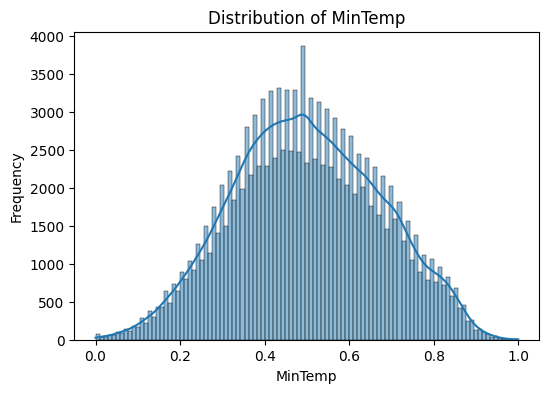

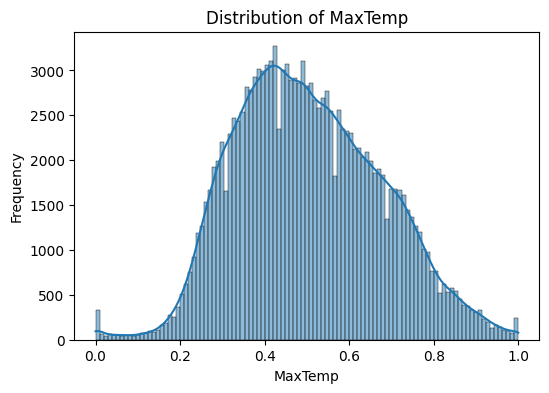

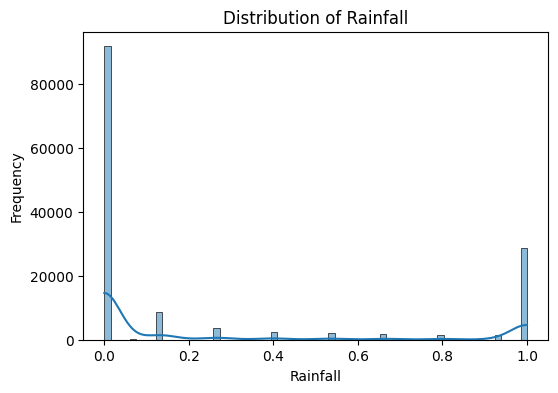

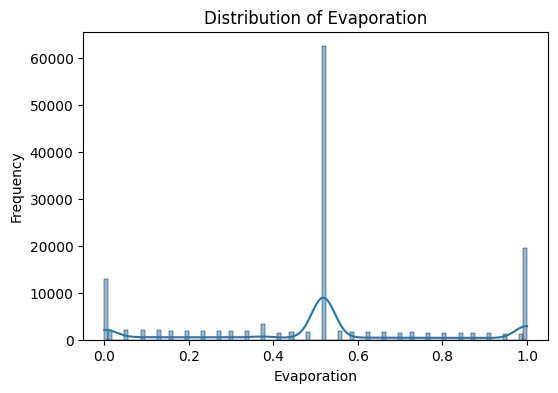

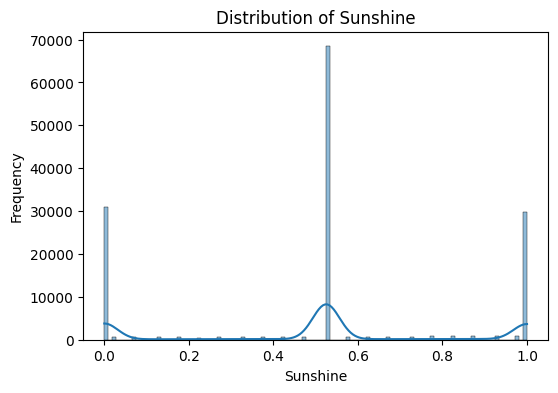

...

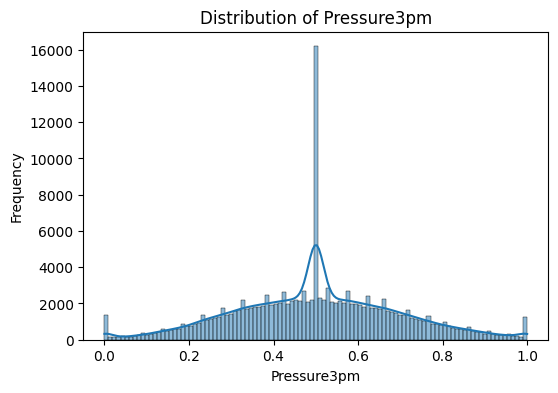

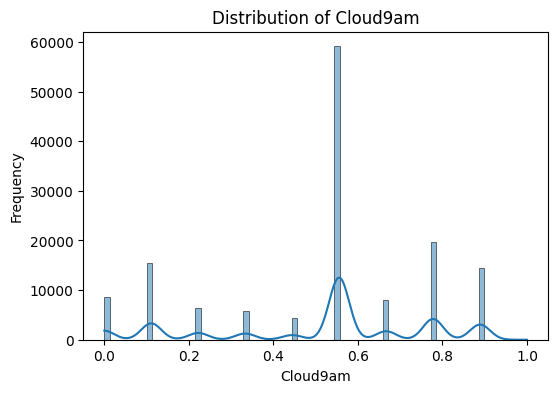

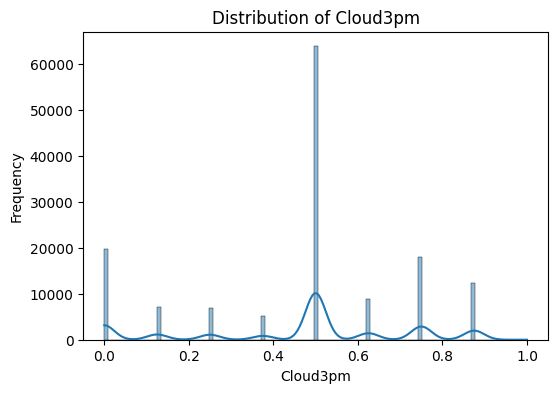

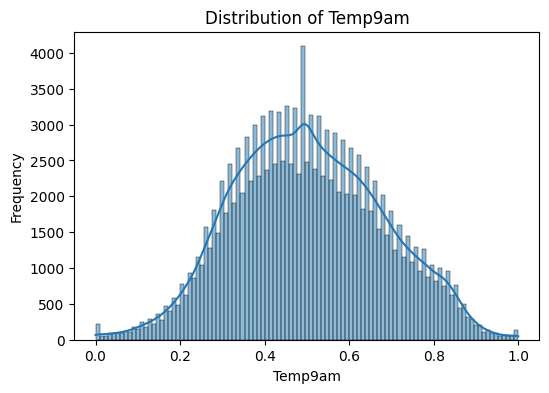

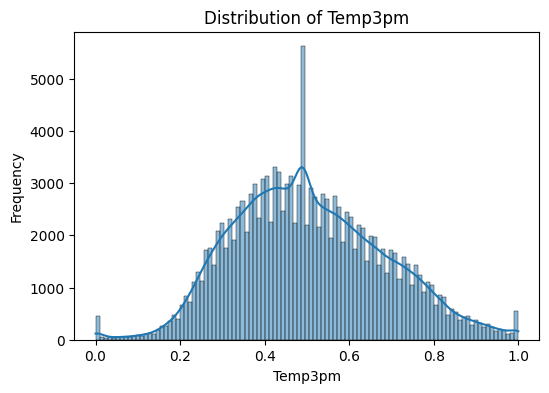

In [144]:
for col in numeric_cols.columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

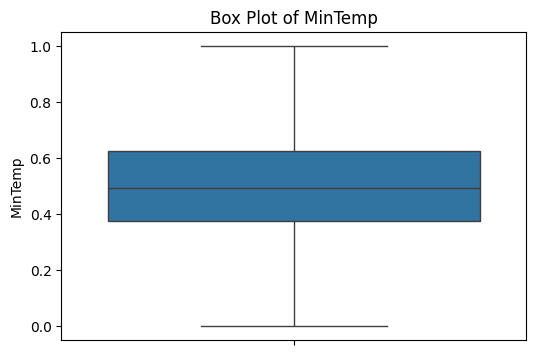

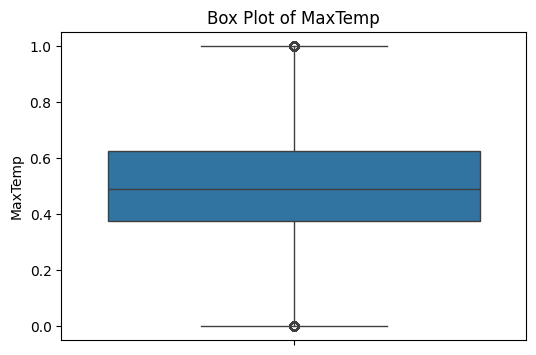

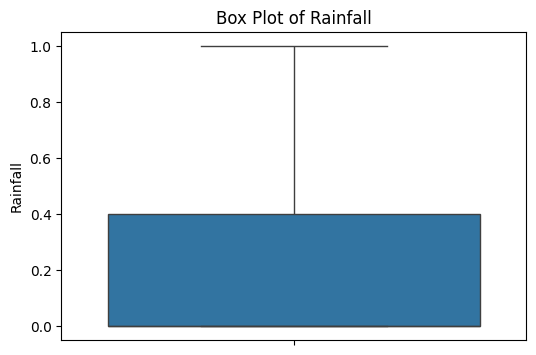

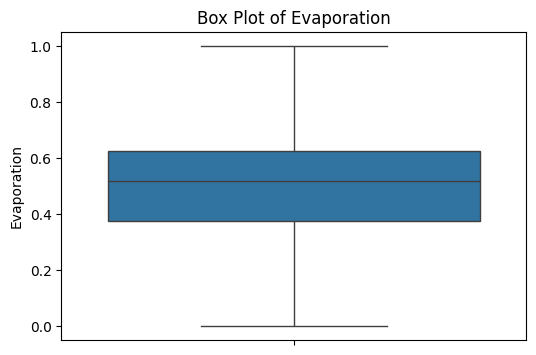

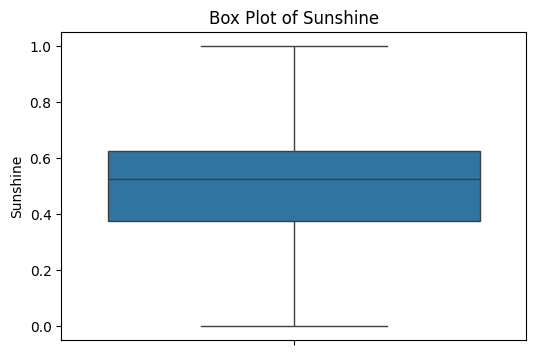

...

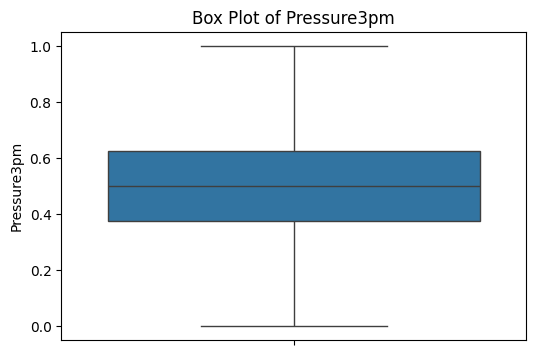

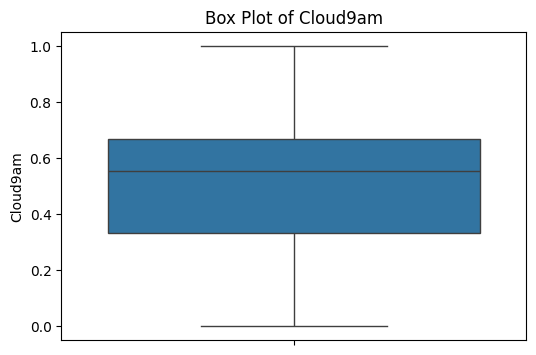

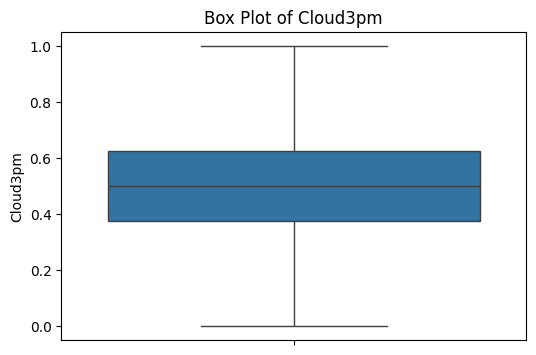

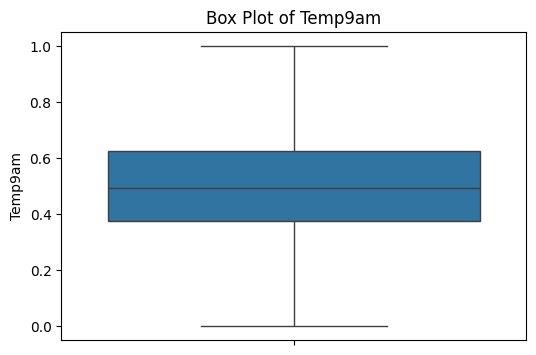

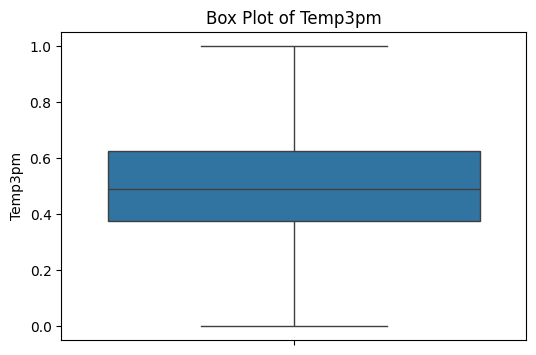

In [145]:
for col in numeric_cols.columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df[col])
    plt.title(f'Box Plot of {col}')
    plt.ylabel(col)
    plt.show()

In [146]:
for col in numeric_cols.columns:
    print(f"\nStatistics for {col}:")
    print(f"Mean: {df[col].mean()}")
    print(f"Median: {df[col].median()}")
    print(f"Mode: {df[col].mode()[0]}")
    print(f"Standard Deviation: {df[col].std()}")


Statistics for MinTemp:
Mean: 0.4996145213427168
Median: 0.4945652173913043
Mode: 0.4945652173913043
Standard Deviation: 0.17361654500984897

Statistics for MaxTemp:
Mean: 0.5043337444893843
Median: 0.4890776699029127
Mode: 0.4890776699029127
Standard Deviation: 0.17216502854773894

Statistics for Rainfall:
Mean: 0.2570491895542548
Median: 0.0
Mode: 0.0
Standard Deviation: 0.40691496424046975

Statistics for Evaporation:
Mean: 0.5170110441323084
Median: 0.5178571428571428
Mode: 0.5178571428571428
Standard Deviation: 0.29109578326159946

Statistics for Sunshine:
Mean: 0.5112162666028818
Median: 0.5250000000000004
Mode: 0.5250000000000004
Standard Deviation: 0.3394267448509652

Statistics for WindGustSpeed:
Mean: 0.5183832357796788
Median: 0.5083333333333333
Mode: 0.5083333333333333
Standard Deviation: 0.20339298678208123

Statistics for WindSpeed9am:
Mean: 0.3757753842315976
Median: 0.35135135135135137
Mode: 0.35135135135135137
Standard Deviation: 0.23115973491367356

Statistics for Wi

# **Bivariate Analysis and Multivariate Analysis.**

In [ ]:
for col1 in numeric_cols.columns:
    for col2 in numeric_cols.columns:
        if col1 != col2:
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=df[col1], y=df[col2])
            plt.title(f'Scatter Plot of {col1} vs {col2}')
            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.show()

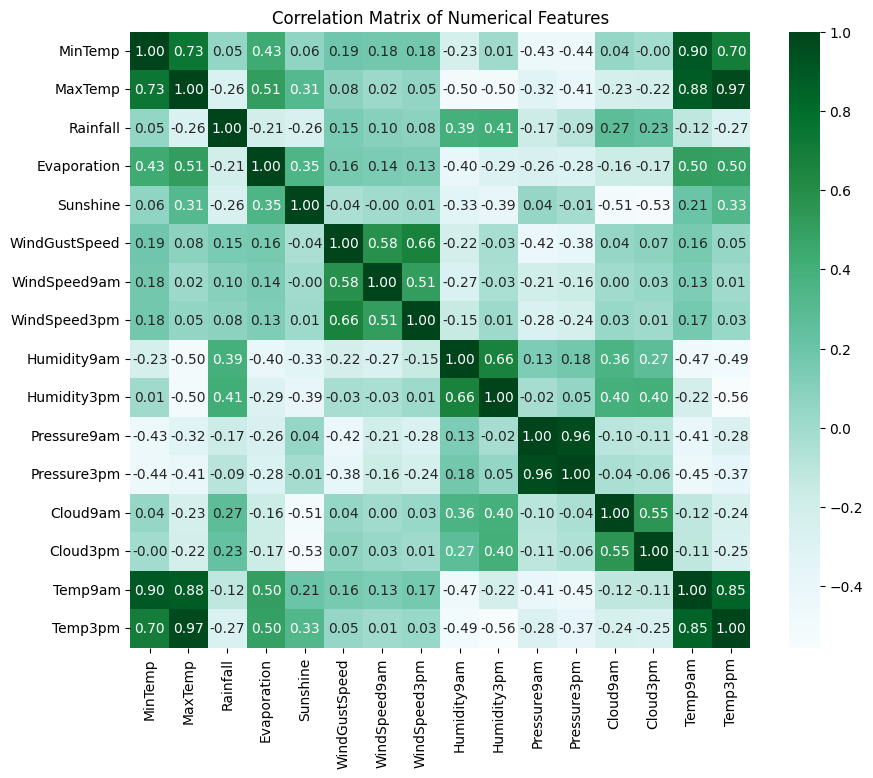

In [149]:
correlation_matrix = numeric_cols.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='BuGn', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

<Figure size 1000x1000 with 0 Axes>

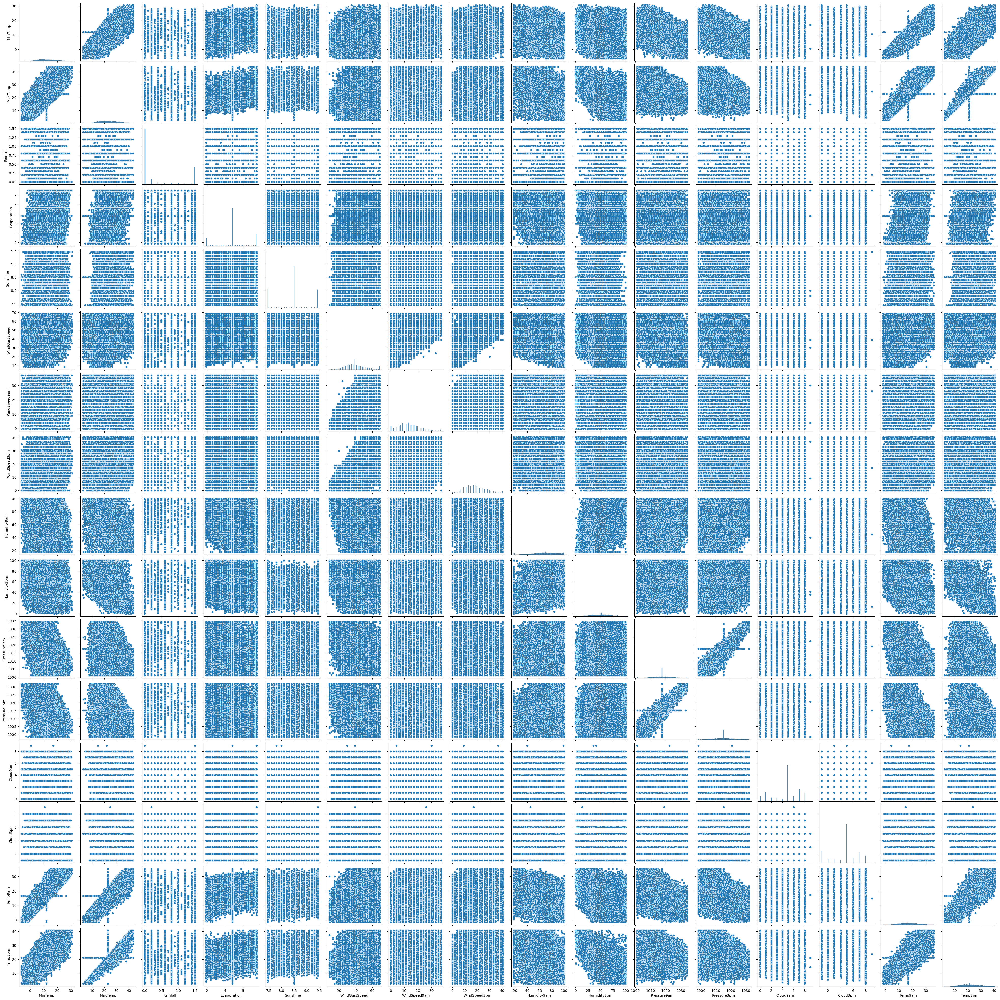

In [150]:
plt.figure(figsize=(10, 10))
sns.pairplot(numeric_cols)
plt.show()

**Feature Analysis**

In [151]:
continuous_features = df.select_dtypes(include=['float64', 'int64']).columns
target_variable = 'RainTomorrow'

if target_variable in continuous_features:
    correlations = df[continuous_features].corr()[target_variable]
    correlations = correlations.sort_values(ascending=False)
    print("Correlation with Target Variable:")
    print(correlations)

Correlation with Target Variable:
RainTomorrow     1.000000
Humidity3pm      0.439790
Rainfall         0.323884
RainToday        0.306548
Cloud3pm         0.296419
Humidity9am      0.256112
Cloud9am         0.248872
WindGustSpeed    0.220684
WindSpeed9am     0.088527
WindSpeed3pm     0.083882
MinTemp          0.083713
Temp9am         -0.025537
Evaporation     -0.101078
MaxTemp         -0.158845
Temp3pm         -0.190389
Pressure3pm     -0.212294
Pressure9am     -0.231656
Sunshine        -0.293430
Name: RainTomorrow, dtype: float64
